<style>
    .logo {
        position: relative;
        float: left;
        margin-right: 15px;
    }
</style>

<div style="display: flex; align-items: center;">
    <img src="img/tp.png" width="80" height="80" class="logo">
</div>
<center>
    <h3>IMA201</h3><br></br>
    <h2>Compte rendu du TP 3</h2>
    <h3>Réalisé par : BOUZID Atef</h3>
    <h4>2024-2025</h4>
</center>



# Importations 

In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
import skimage as sk
from skimage.filters import threshold_otsu


from scipy import ndimage
from scipy import signal
import math 

from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances_argmin
from sklearn.datasets import load_sample_image
from sklearn.utils import shuffle
from time import time
import skimage.morphology as morpho  

from skimage import io

from skimage import filters

import mrlab as mr
import warnings

# 1. Détection de contours 
## 1.1 Filtre de gradient local par masque

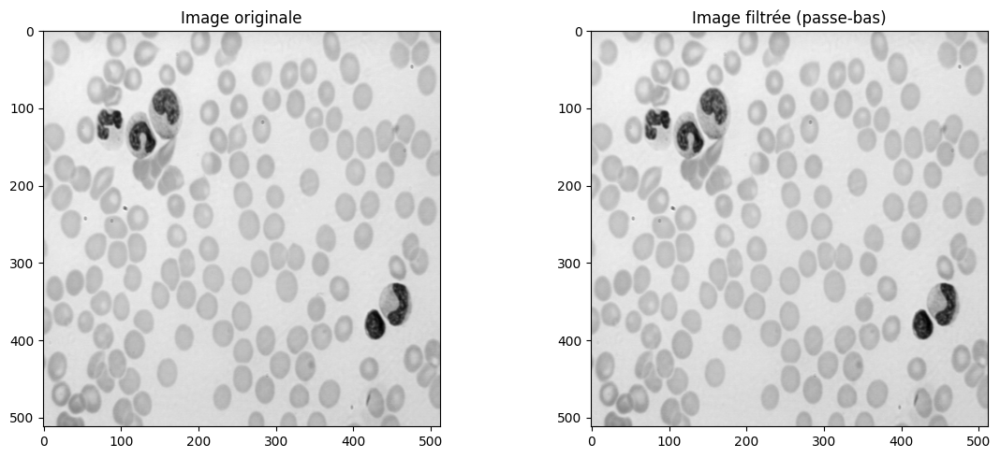

In [2]:
ima=io.imread('cell.tif').astype(np.float32)
sigma=0
seuilnorme=0.1

plt.figure(figsize=(12,5))

gfima=filters.gaussian(ima,sigma)

plt.subplot(121)
plt.title('Image originale')
plt.imshow(ima, cmap='gray')

plt.subplot(122)
plt.title('Image filtrée (passe-bas)')
plt.imshow(gfima, cmap='gray')

plt.tight_layout()
plt.show()

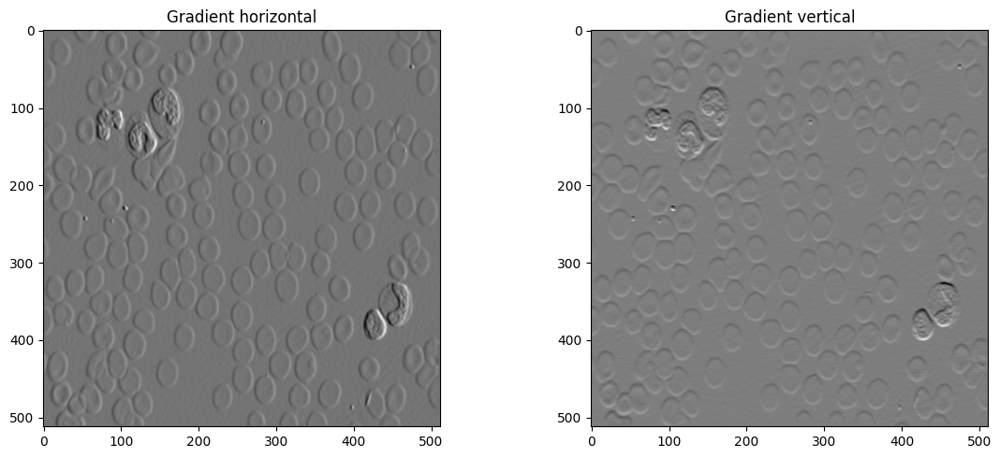

In [3]:
gradx=mr.sobelGradX(gfima)
grady=mr.sobelGradY(gfima)  

plt.figure(figsize=(12,5))


plt.subplot(121)
plt.title('Gradient horizontal')
plt.imshow(gradx, cmap='gray')

plt.subplot(122)
plt.title('Gradient vertical')
plt.imshow(grady, cmap='gray')


plt.tight_layout()
plt.show()

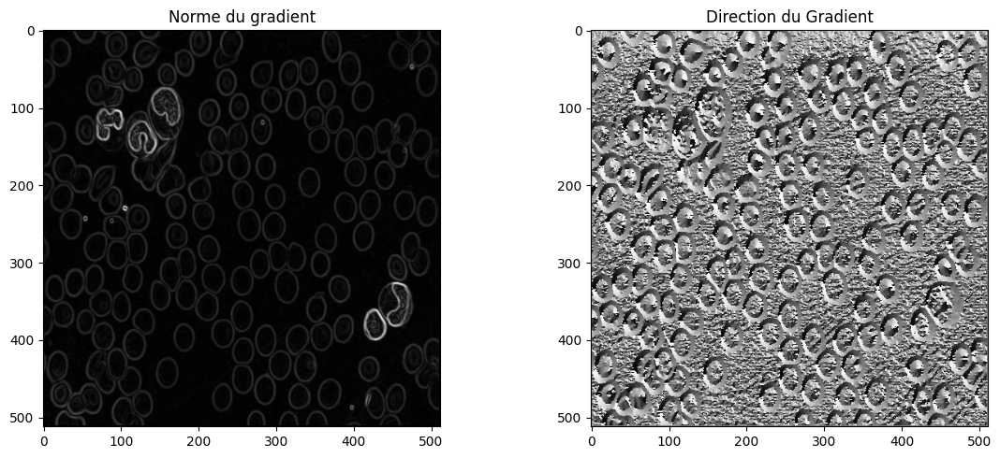

In [4]:
norme=np.sqrt(gradx*gradx+grady*grady)

plt.figure(figsize=(12,5))

plt.subplot(121)
plt.title('Norme du gradient')
plt.imshow(norme, cmap='gray')

direction=np.arctan2(grady,gradx)

plt.subplot(122)
plt.title('Direction du Gradient')
plt.imshow(direction, cmap='gray')


plt.tight_layout()
plt.show()

* L’intérêt du filtre de Sobel, par rapport au filtre différence, qui calcule une dérivée
 par la simple différence entre deux pixels voisins:
 
        Le filtre de Sobel est un opérateur de convolution qui permet de calculer une approximation du gradient de l'image. Il est plus robuste au bruit que le simple filtre différence qui calcule la dérivée en utilisant la différence entre deux pixels voisins.

        Le filtre de Sobel utilise un masque 3x3 qui prend en compte les pixels voisins dans les deux directions (horizontale et verticale), ce qui lui permet de mieux lisser le bruit et de donner des contours plus précis.

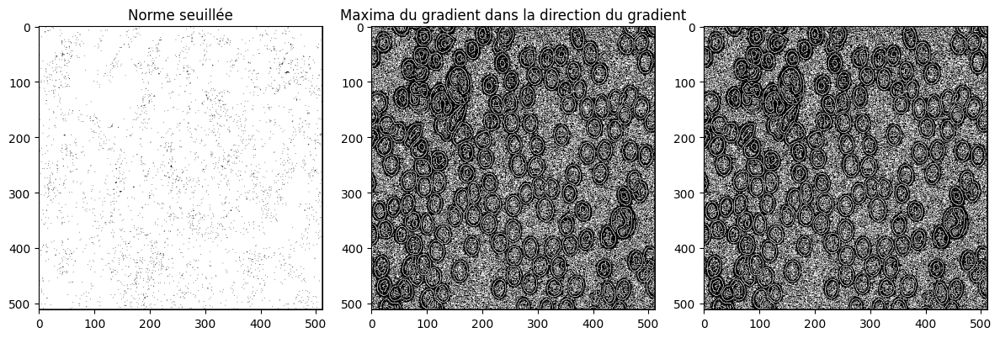

In [5]:
contoursnorme =(norme>seuilnorme) 

plt.figure(figsize=(12,5))

plt.subplot(131)
plt.title('Norme seuillée')
plt.imshow(255*contoursnorme,cmap = 'gray')


contours=np.uint8(mr.maximaDirectionGradient(gradx,grady))

plt.subplot(132)
plt.title('Maxima du gradient dans la direction du gradient')
plt.imshow(255*contours,cmap = 'gray')


plt.subplot(133)
valcontours=(norme>seuilnorme)*contours
      
plt.imshow(255*valcontours,cmap = 'gray')

plt.tight_layout()
plt.show()

* Nécessité d'un filtre passe-bas avant le filtre de Sobel:

        même si le filtre de sobel integre une structre de moyennage. Cependant cela peut etre tres benefique dans certain cas. Il est généralement recommandé d'appliquer un filtre passe-bas (comme un filtre gaussien) avant d'utiliser le filtre de Sobel.
  
        Le filtre passe-bas permet de réduire le bruit haute fréquence dans l'image, ce qui améliore la qualité des contours détectés par le filtre de Sobel.
  
* Effet du seuillage de la norme du gradient sur la qualité des contours:

        En comparent les images obtenu de la norme de gradient avant et après seuillage, on remarque que l'image de norme de gradient brute presente plusieurs niveau de gris ce qui ne permet pas de distinguer la difference entre les contours reels est celle de la vaiance de l'image normale. En ce qui concerne l'image seuillété, on remarque qu'on a une bonne distinction des contours relles. En effet, en utilisant un seuil de la norme on dispose des partie present dans l'image de la norme qui sont faible et qui ne representent pas réellement des contour. Donc le seuillage permet d'eleminer les faux contour detécté qui sont du au bruit 
        > Le seuillage de la norme du gradient permet de sélectionner les contours les plus significatifs en éliminant les contours faibles qui pourraient correspondre à du bruit.


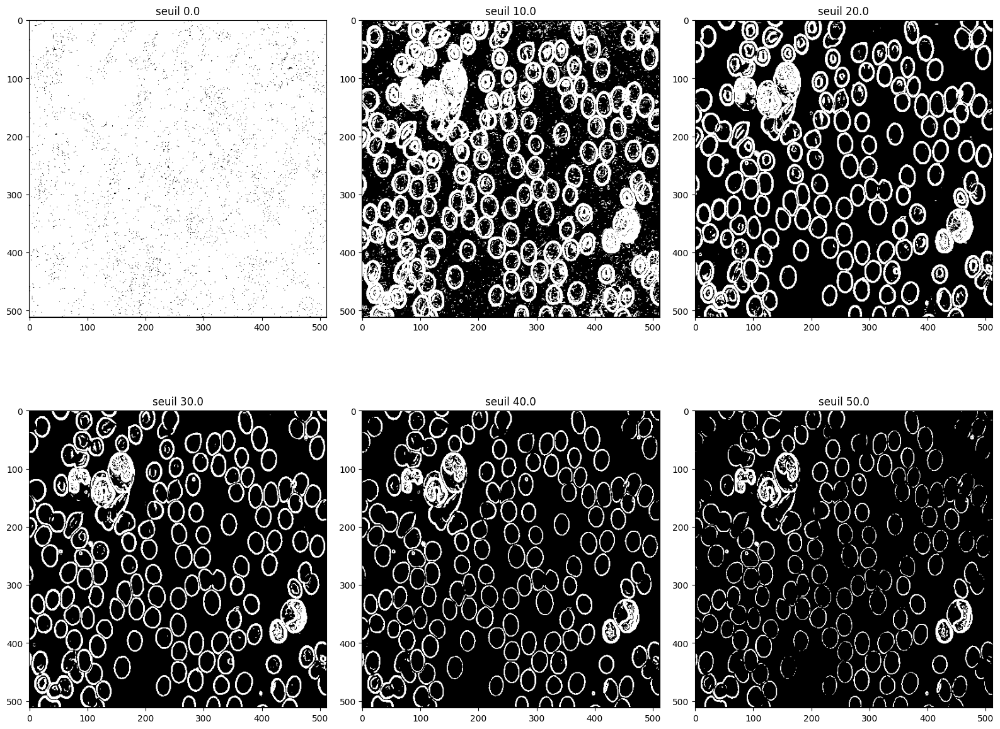

In [6]:
seuilnormes =np.linspace(0,50,6)
images=[]
for seuilnorm in seuilnormes :
    images.append(norme>seuilnorm)


plt.figure(figsize=(16,13))

for i in range(1,len(seuilnormes)+1):
    plt.subplot(2,3,i)
    plt.imshow(255*images[i-1],cmap='gray')
    plt.title(f'seuil {seuilnormes[i-1]}')
plt.tight_layout()
plt.show()

- En faisant varier le seuil, on peut observer l'impact sur :

        Robustesse au bruit: Un seuil plus élevé réduit le bruit mais peut aussi éliminer des contours importants.
      
        Continuité des contours: Un seuil trop bas peut donner des contours discontinus et fragmentés.
      
        Épaisseur des contours: Un seuil plus bas donne généralement des contours plus épais.
      
        Position des contours: Le seuillage peut légèrement affecter la position des contours.


## 1.2 Maxima du module du gradient dans la direction du gradient

In [7]:
%run mrlab.py 

In [8]:
help(maximaDirectionGradient)

Help on function maximaDirectionGradient in module __main__:

maximaDirectionGradient(gradx, grady, seuil=0.0001)
    ################################################
    # 22 mai 2019



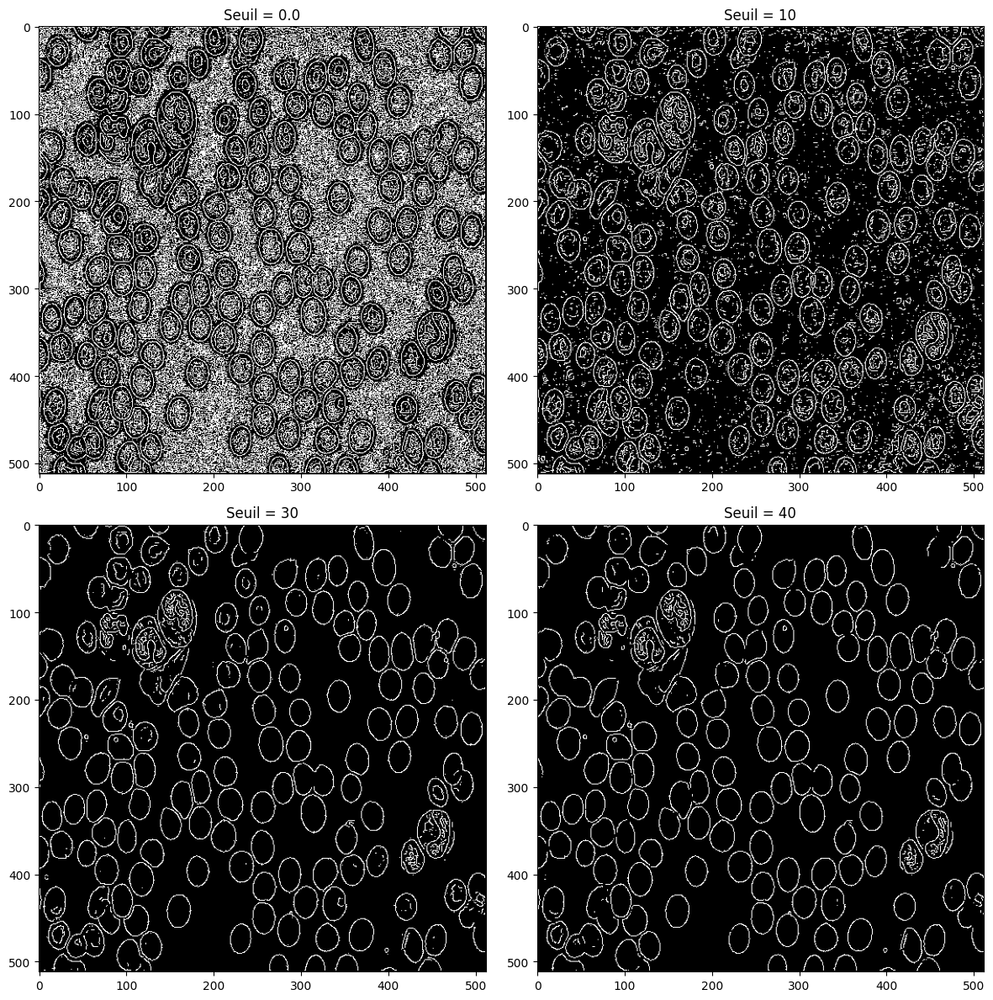

In [9]:
plt.figure(figsize=(12,12))

plt.subplot(221)
SEUIL = 0.0
plt.title(f'Seuil = {SEUIL}')
plt.imshow(maximaDirectionGradient(gradx,grady,seuil = SEUIL),cmap='gray')

plt.subplot(222)
SEUIL = 10
plt.title(f'Seuil = {SEUIL}')
plt.imshow(maximaDirectionGradient(gradx,grady,seuil = SEUIL),cmap='gray')

plt.subplot(223)
SEUIL = 30
plt.title(f'Seuil = {SEUIL}')
plt.imshow(maximaDirectionGradient(gradx,grady,seuil = SEUIL),cmap='gray')

plt.subplot(224)
SEUIL = 40
plt.title(f'Seuil = {SEUIL}')
plt.imshow(maximaDirectionGradient(gradx,grady,seuil = SEUIL),cmap='gray')

plt.tight_layout()
plt.show()

* la recherche des maxima locaux de |∇Iσ| dans la direction de ∇Iσ revient à chercher les passages par zéro de D2I(∇I,∇I).

2. Impact du seuil sur la norme du gradient :

● Position des contours: Le seuillage peut influencer légèrement la position des contours. En augmentant le seuil, vous risquez de déplacer légèrement le contour vers l'intérieur de l'objet, car seuls les pixels avec un gradient très élevé seront retenus.

● Continuité des contours: Un seuil trop élevé peut fragmenter les contours, créant ainsi des discontinuités. Un seuil bas permet de conserver plus de détails mais peut aussi inclure du bruit.

● Robustesse au bruit: Un seuil plus élevé permet d'éliminer les contours faibles qui correspondent souvent à du bruit.

-> Meilleur résultat pour un seuil 40

## 1.3 Passage par zéro du laplacien

In [10]:
# %run laplacien.py

def passage_par_zero(ima ,alpha = 0.5):
    
    gradx=mr.dericheGradX(mr.dericheSmoothY(ima,alpha),alpha)
    grady=mr.dericheGradY(mr.dericheSmoothX(ima,alpha),alpha)  
    
    gradx2=mr.dericheGradX(mr.dericheSmoothY(gradx,alpha),alpha)
    grady2=mr.dericheGradY(mr.dericheSmoothX(grady,alpha),alpha)  
    
    plt.figure(figsize=(10,10))
    plt.axis('off')
    
    plt.title(f'alpha = {alpha}')
      
    plt.subplot(221)
    plt.title('Image originale')
    plt.imshow(ima, cmap='gray')
    
    
    lpima=gradx2+grady2
    
    plt.subplot(222)
    plt.title('Laplacien')
    plt.imshow(lpima, cmap='gray')
    
    
    posneg=(lpima>=0)
    
    plt.subplot(223)
    plt.title('Laplacien binarisé -/+')
    plt.imshow(255*posneg, cmap='gray')
    
    nl,nc=ima.shape
    contours=np.uint8(np.zeros((nl,nc)))
    
    
    for i in range(1,nl):
        for j in range(1,nc):
            if (((i>0) and (posneg[i-1,j] != posneg[i,j])) or
                ((j>0) and (posneg[i,j-1] != posneg[i,j]))):
                contours[i,j]=255
                
    plt.subplot(224)   
    plt.title('Contours')
    plt.imshow(contours, cmap='gray')
    
    plt.tight_layout()
    plt.show()

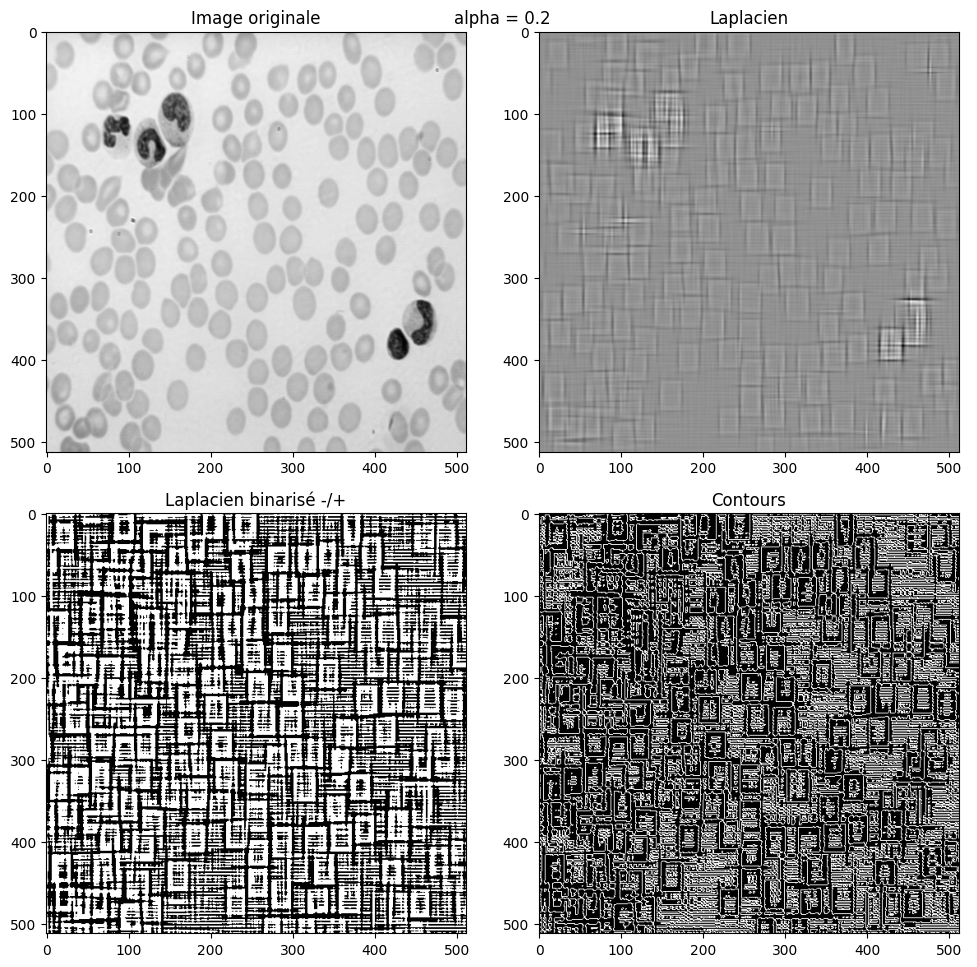

In [11]:
ima=io.imread('cell.tif').astype(np.float32)

passage_par_zero(ima,0.2)

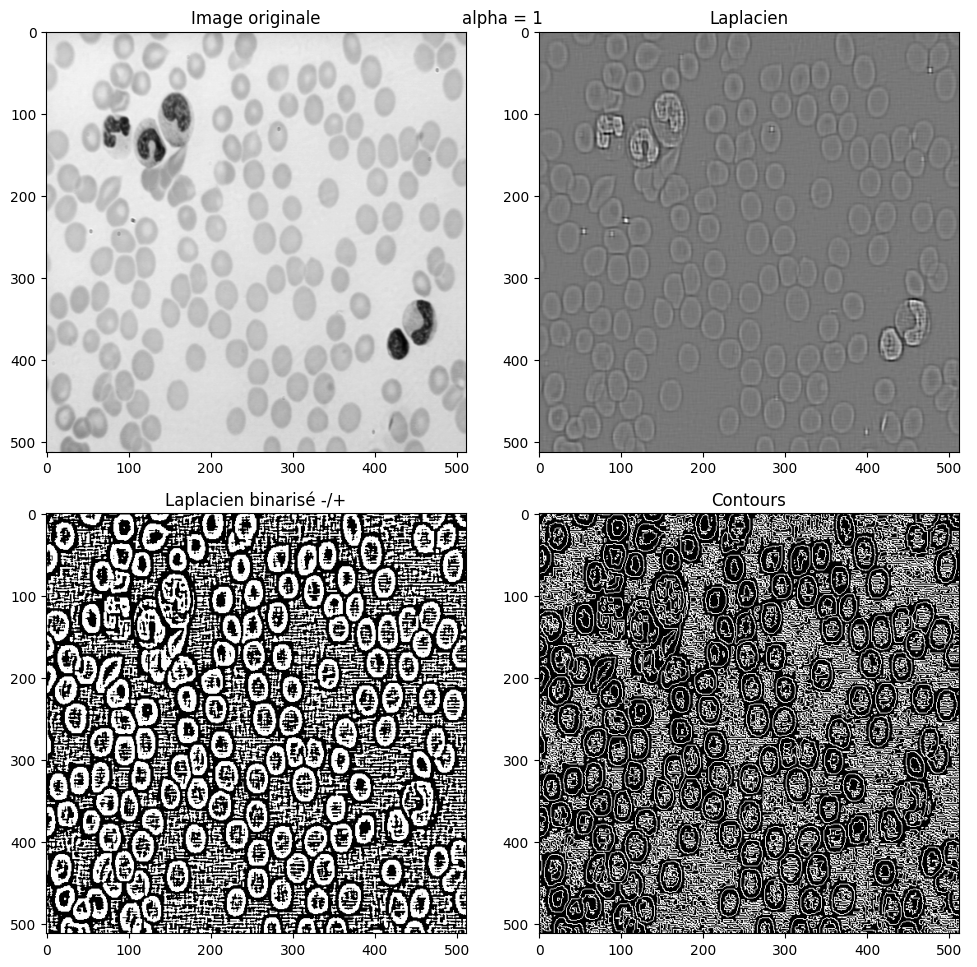

In [12]:
ima=io.imread('cell.tif').astype(np.float32)

passage_par_zero(ima,1)

> **quand alpha est plus grand il fait un 'filtrage passe bas' fin avant de commencer , si alpha est petite il fait un 'filtre passe bas' grand avant  de commencer**
>
> La valeur d'alpha influence la sensibilité au bruits. En effet pour des valeurs faible de alpha on remarque que les images sont moins bruité que pour les valeurs plus fortes mais on perd en terme de precision de detection des contours.

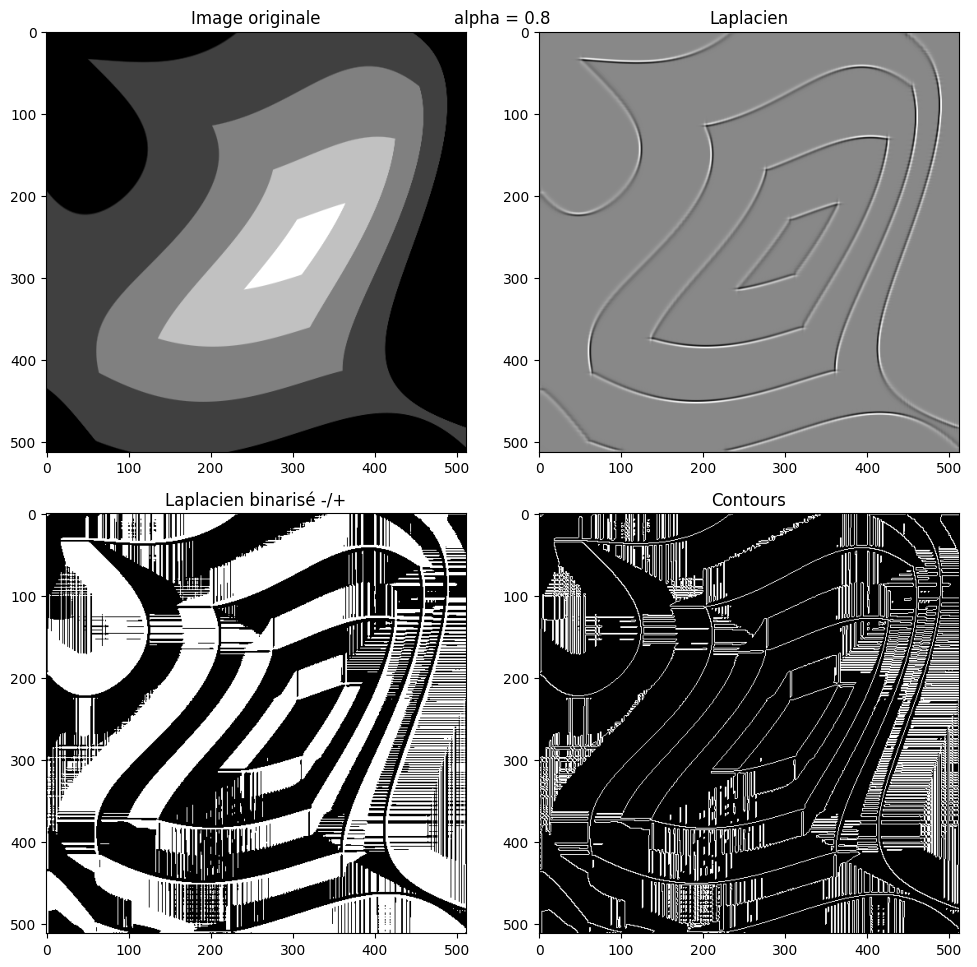

In [13]:
im = io.imread('pyramide.tif').astype(np.float32)

passage_par_zero(im , 0.8)

Pour réduire l'apparition des faux contours, j'ai modifié la fonction en ajoutant un seuil pour filtrer le bruit et une vérification des voisins pour rendre la détection des contours plus robuste. Cela permet de réduire la sensibilité aux petites variations et d’éliminer les faux contours.

In [14]:
def FIXED_passage_par_zero2(ima, alpha=0.5, threshold=10):
    # Calculate gradients
    gradx = mr.dericheGradX(mr.dericheSmoothY(ima, alpha), alpha)
    grady = mr.dericheGradY(mr.dericheSmoothX(ima, alpha), alpha)

    # Second-order gradients for Laplacian
    gradx2 = mr.dericheGradX(mr.dericheSmoothY(gradx, alpha), alpha)
    grady2 = mr.dericheGradY(mr.dericheSmoothX(grady, alpha), alpha)
    
    # Display setup
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.title(f'alpha = {alpha}')

    # Original Image
    plt.subplot(221)
    plt.title('Image originale')
    plt.imshow(ima, cmap='gray')

    # Laplacian Image
    lpima = gradx2 + grady2
    plt.subplot(222)
    plt.title('Laplacien')
    plt.imshow(lpima, cmap='gray')

    # Binarize Laplacian using threshold to remove noise
    posneg = np.abs(lpima) > threshold
    plt.subplot(223)
    plt.title('Laplacien binarisé -/+')
    plt.imshow(255 * posneg, cmap='gray')

    # Initialize contour array
    nl, nc = ima.shape
    contours = np.zeros((nl, nc), dtype=np.uint8)

    # Contour detection with refined zero-crossing logic
    for i in range(1, nl - 1):
        for j in range(1, nc - 1):
            # Check for zero-crossing with neighbors, and apply margin for robustness
            if (posneg[i, j] and 
                ((posneg[i-1, j] != posneg[i, j]) or
                 (posneg[i+1, j] != posneg[i, j]) or
                 (posneg[i, j-1] != posneg[i, j]) or
                 (posneg[i, j+1] != posneg[i, j]))):
                contours[i, j] = 255

    # Plot Contours
    plt.subplot(224)
    plt.title('Contours')
    plt.imshow(contours, cmap='gray')

    plt.tight_layout()
    plt.show()

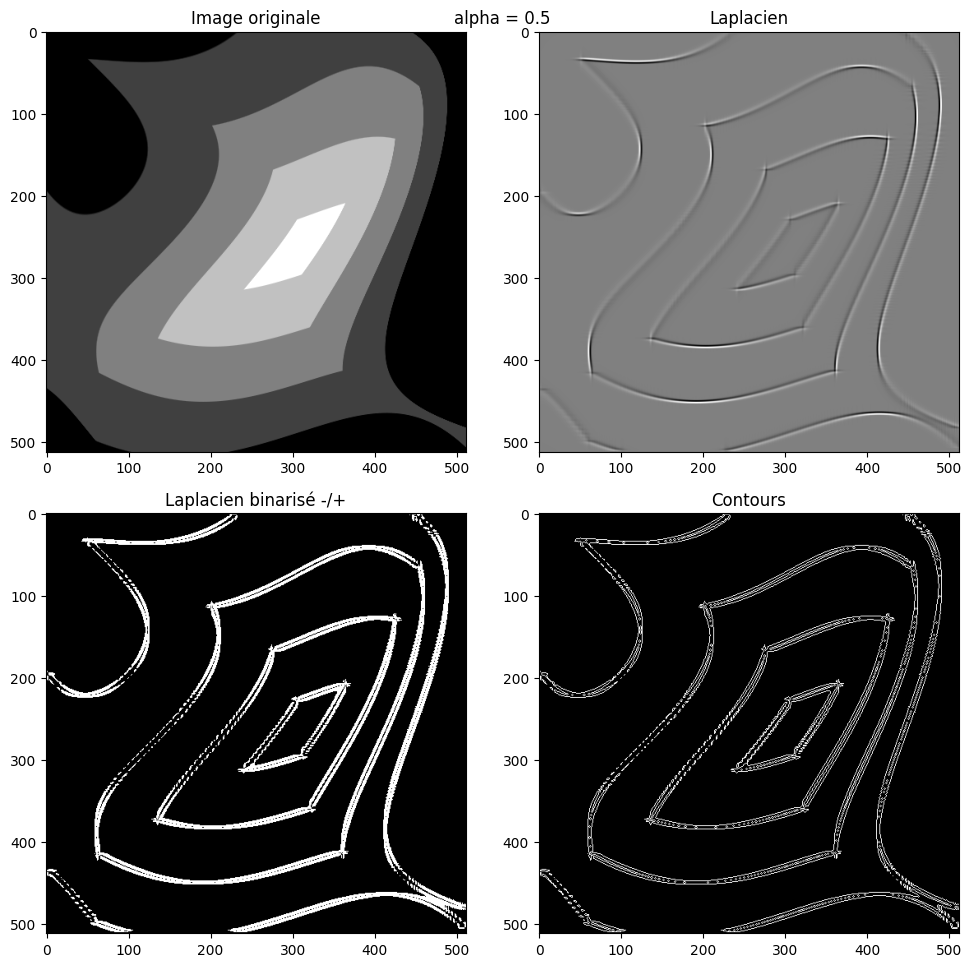

In [15]:
FIXED_passage_par_zero2(im,alpha=0.5,threshold=0.08)

## 1.4 adaptation en fonction de l'image 

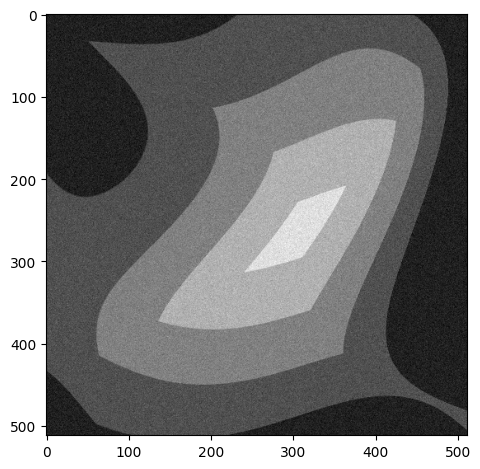

In [16]:
im = io.imread('pyra-gauss.tif').astype(np.float32)

plt.imshow(im,cmap='gray')

plt.tight_layout()
plt.show()

L'image `pyra-gauss.tif` a déjà été prétraitée avec un filtre gaussien.  Considérant cela, l'**algorithme de Canny** semble être le plus approprié pour la segmentation.  Voici pourquoi :

* **Robustesse:** Canny est reconnu pour sa robustesse au bruit, ce qui est avantageux puisque l'image a déjà été lissée.
* **Contours précis et fins:** La méthode de Canny est conçue pour détecter des contours fins et précis, ce qui pourrait être utile pour une image comme `pyra-gauss.tif` si elle présente des détails géométriques. 
* **Hystérésis:** L'étape d'hystérésis de l'algorithme de Canny permet de connecter les contours forts tout en éliminant les contours faibles, améliorant ainsi la continuité des contours détectés.

### Pré-traitements :

L'image ayant déjà subi un filtrage gaussien, d'autres pré-traitements pourraient ne pas être nécessaires. Cependant, en fonction du contenu de l'image et de l'objectif de la segmentation, vous pourriez envisager :

* **Ajustement de contraste:** Si l'image présente un faible contraste, un ajustement de contraste pourrait améliorer la détection des contours.
* **Suppression du bruit résiduel:** Si du bruit subsiste malgré le filtre gaussien, un filtre médian pourrait être appliqué pour le supprimer sans trop affecter les contours.

### Post-traitements :

Après l'application de l'algorithme de Canny, les post-traitements suivants pourraient être utiles :

* **Seuillage des contours:** Vous pouvez ajuster un seuil sur l'intensité des contours pour éliminer les contours faibles ou indésirables.
* **Fermeture morphologique:** La fermeture morphologique peut aider à combler les petits trous dans les contours et à les rendre plus continus.
* **Amincissement des contours:** Si nécessaire, les contours peuvent être amincis pour obtenir une représentation plus fine des frontières. 

# 2. Segmentation par classification : K-moyennes
## 2.1 Image à niveaux de gris

In [17]:
def recreate_image(codebook, labels, w, h):
    """Recreate the (compressed) image from the code book & labels"""
    image = np.zeros((w, h))
    label_idx = 0
    for i in range(w):
        for j in range(h):
            image[i][j] = codebook[labels[label_idx]]
            label_idx += 1
    return image

def kmean1(ima,random_state=0,n_class=2):
    # Convert to floats instead of the default 8 bits integer coding. Dividing by
    # 255 is important so that plt.imshow behaves works well on float data (need to
    # be in the range [0-1])
    ima = np.array(ima, dtype=np.float64) / 255
        
    # Load Image and transform to a 2D numpy array.
    w, h = original_shape = tuple(ima.shape)
    d = 1
    image_array = np.reshape(ima, (w * h, d))
    
    t0 = time()
    image_array_sample = shuffle(image_array, random_state=random_state)[:1000]
    kmeans = KMeans(n_clusters=n_class, random_state=random_state).fit(image_array_sample)
    print("Fitting model on a small sub-sample of the data done in : %0.3fs." % (time() - t0))
    
    # Get labels for all points
    t0 = time()
    labels = kmeans.predict(image_array)
    print("Predicting color indices on the full image (k-means) done in : %0.3fs." % (time() - t0))
    
    plt.figure(figsize=(12,5))
    plt.title(f'n_class = {n_class}')
    plt.axis('off')
    
    # Display all results, alongside original image
    plt.subplot(121)
    plt.title('Original image')
    plt.imshow(ima,cmap='gray')
    plt.axis('off')
    
    
    plt.subplot(122)
    plt.title('Quantized image with KMeans')
    plt.imshow(recreate_image(kmeans.cluster_centers_, labels, w, h),cmap='gray')
    plt.axis('off')
    
    
    plt.tight_layout()
    plt.show()

Fitting model on a small sub-sample of the data done in : 0.072s.
Predicting color indices on the full image (k-means) done in : 0.003s.


C:\Users\MSI\AppData\Local\Temp\ipykernel_576\1968868505.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  image[i][j] = codebook[labels[label_idx]]


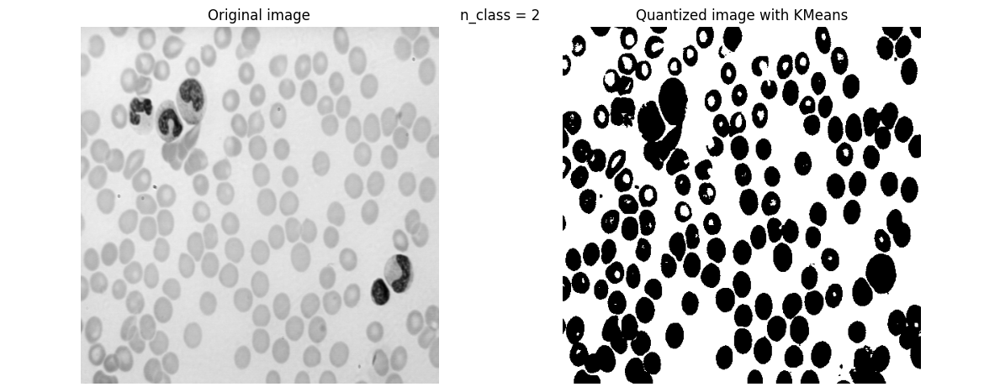

In [18]:
ima=io.imread('cell.tif')

kmean1(ima,n_class=2)

Non cette méthode ne segmente pas correctement les differents types de cellules. En effet, on peut remarquer 2 problèmes. Le premier est que dans l'image on a 3 choses à segmenter : le fond de l'image + 2 types de cellules. Donc la supposition qu'on a 2 classe est fausse. Le deuxieme probleme est que pour certaines cellules on a un interieur que notre methode classe comme un fond ce qui est faux car l'interieur d'une cellule appartient à la cellule. Pour remider au premier problème on peut augmenter le nombre de classe à 3 pour avoir un mieux classement

Fitting model on a small sub-sample of the data done in : 0.009s.
Predicting color indices on the full image (k-means) done in : 0.003s.


C:\Users\MSI\AppData\Local\Temp\ipykernel_576\1968868505.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  image[i][j] = codebook[labels[label_idx]]


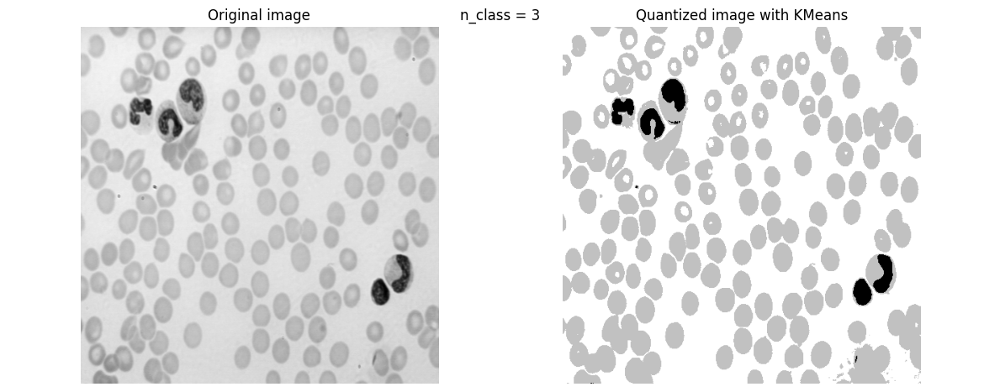

In [19]:
kmean1(ima,random_state = 42,n_class=3)

Comme prévu, en augmentant le nombre de classe à trois on parvient de bien distinguer les zones qui contiennent des anomalies dans les cellules.

Fitting model on a small sub-sample of the data done in : 0.011s.
Predicting color indices on the full image (k-means) done in : 0.002s.


C:\Users\MSI\AppData\Local\Temp\ipykernel_576\1968868505.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  image[i][j] = codebook[labels[label_idx]]


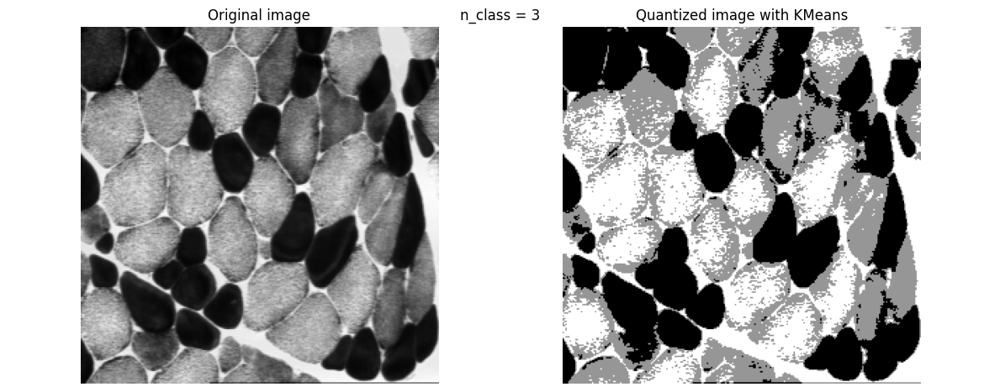

In [20]:
ima = io.imread('muscle.tif')
kmean1(ima,random_state = 0,n_class=3)


Dans cette image, meme avec un nombre de classe connu et une bonne initialisation de l'algorithm on remarque que les cellules de couleur gris clair sont mal classé. En effet ces cellules ne présentent pas le meme niveau de gris et comprennent plusieurs niveau. Et puisque l'algorithm de k-means ne tient pas compte de la coherence spatial le résultat sera basé uniquement sur le niveau de gris du pixel. Donc on aure des pixel mal classé meme s'il sont à l'interieur d'une cellule.

En appliquant un filtrage moyenne on va diminuer la variance dans l'image (comme on fair pour le débruitage) puisqu'on applique un filtre passe bas qui adoucie le bruit et les changements à niveau de gris très brutale. Le resultat sera donc plus homogenes dans les zones semblable (comme dans le cas de l'interieur d'une cellule) ce qui va améliorer la qualité de la segementation avec le k-means.

> il y a des bruit d'impulsion on peut appliquer un filtre median avant d'utiliser le kmeans1, filtre median peut nous aider


In [21]:
def median_filter(im,typ=1,r=1,xy=None):
    """ renvoie le median de l'image im.
    si typ==1 (defaut) le median est calcule sur un carre de cote 2r+1
    si typ==2 : disque de rayon r
    si typ==3 alors xy est un couple de liste de x et liste de y
         ([-1,0,1] , [0,0,0]) donne un median sur un segment horizontql de taille trois. 
         """
    lx=[]
    ly=[]
    (ty,tx)=im.shape
    if typ==1: #carre
        
        for k in range(-r,r+1):
            for l in range(-r,r+1):
                lx.append(k)
                ly.append(l)
        
    elif typ==2:
        for k in range(-r,r+1):
            for l in range(-r,r+1):
                if k**2+l**2<=r**2:
                    lx.append(k)
                    ly.append(l)
    else: #freeshape
        lx,ly=xy
    
    debx=-min(lx) #min is supposed negatif
    deby=-min(ly)
    finx=tx-max(lx) #max is supposed positif
    finy=ty-max(ly)
    ttx=finx-debx
    tty=finy-deby
    tab=np.zeros((len(lx),ttx*tty))
    #print (lx,ly)
    #print(ttx,tty)
    #print(im[deby+ly[k]:tty+ly[k]+deby,debx+lx[k]:debx+ttx+lx[k]].reshape(-1).shape)
    for k in range(len(lx)):
        tab[k,:]=im[deby+ly[k]:deby+tty+ly[k],debx+lx[k]:debx+ttx+lx[k]].reshape(-1)
    out=im.copy()
    out[deby:finy,debx:finx]=np.median(tab,axis=0).reshape((tty,ttx))
    return out

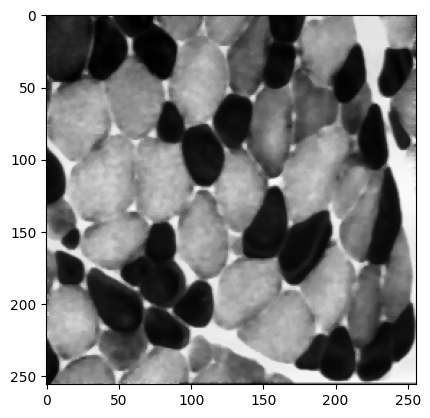

In [22]:
image_filtre = median_filter(ima,typ=2,r=2,xy=None)
plt.imshow(image_filtre,cmap='gray')

Fitting model on a small sub-sample of the data done in : 0.006s.
Predicting color indices on the full image (k-means) done in : 0.002s.


C:\Users\MSI\AppData\Local\Temp\ipykernel_576\1968868505.py:7: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  image[i][j] = codebook[labels[label_idx]]


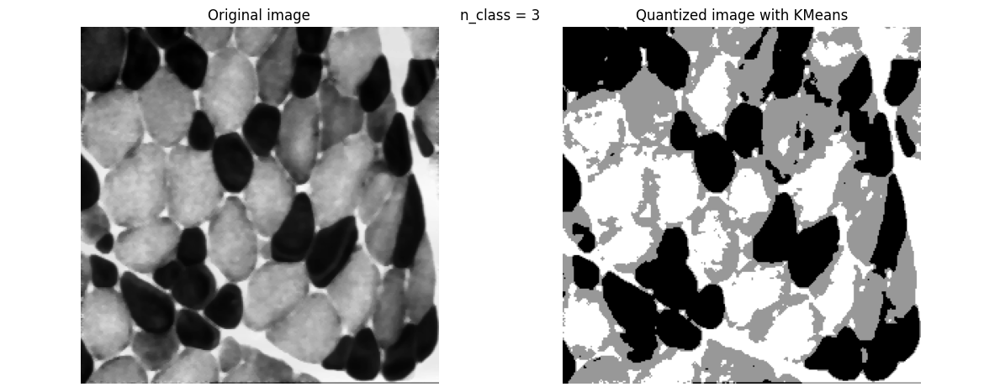

In [23]:
kmean1(image_filtre,0,3)

## 2.2 Image en couleur

In [24]:
def kmean3(ima,n_colors=4) : 
    
    # Convert to floats instead of the default 8 bits integer coding. Dividing by
    # 255 is important so that plt.imshow behaves works well on float data (need to
    # be in the range [0-1])
    ima = np.array(ima, dtype=np.float64) / 255
    
    # Load Image and transform to a 2D numpy array.
    w, h, d = original_shape = tuple(ima.shape)
    assert d == 3
    image_array = np.reshape(ima, (w * h, d))
    
    print("Fitting model on a small sub-sample of the data")
    t0 = time()
    image_array_sample = shuffle(image_array, random_state=0)[:1000]
    kmeans = KMeans(n_clusters=n_colors, random_state=0).fit(image_array_sample)
    print("done in %0.3fs." % (time() - t0))
    
    # Get labels for all points
    print("Predicting color indices on the full image (k-means)")
    t0 = time()
    labels = kmeans.predict(image_array)
    print("done in %0.3fs." % (time() - t0))
    
    def recreate_image(codebook, labels, w, h):
        """Recreate the (compressed) image from the code book & labels"""
        d = codebook.shape[1]
        image = np.zeros((w, h, d))
        label_idx = 0
        for i in range(w):
            for j in range(h):
                image[i][j] = codebook[labels[label_idx]]
                label_idx += 1
        return image
    
    plt.figure(figsize=(12,5))
    plt.title(f'n_class = {n_colors}')
    plt.axis('off')
    
    # Display all results, alongside original image
    plt.subplot(121)
    plt.title('Original image')
    plt.imshow(ima,cmap='gray')
    plt.axis('off')
    
    
    plt.subplot(122)
    plt.title('Quantized image with K-Means: %i colours' %n_colors)
    plt.imshow(recreate_image(kmeans.cluster_centers_, labels, w, h),cmap='gray')
    plt.axis('off')
    
    
    plt.tight_layout()
    plt.show()

Fitting model on a small sub-sample of the data
done in 0.015s.
Predicting color indices on the full image (k-means)
done in 0.004s.


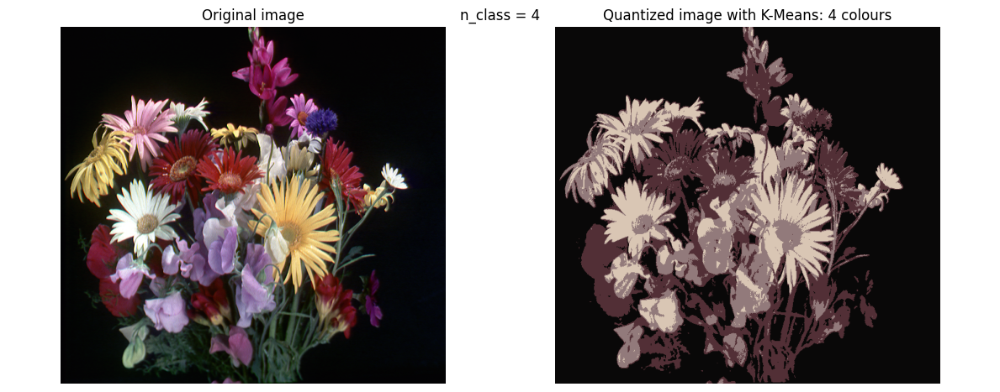

In [25]:
ima = io.imread('fleur.tif')
kmean3(ima,4)

Fitting model on a small sub-sample of the data
done in 0.015s.
Predicting color indices on the full image (k-means)
done in 0.004s.


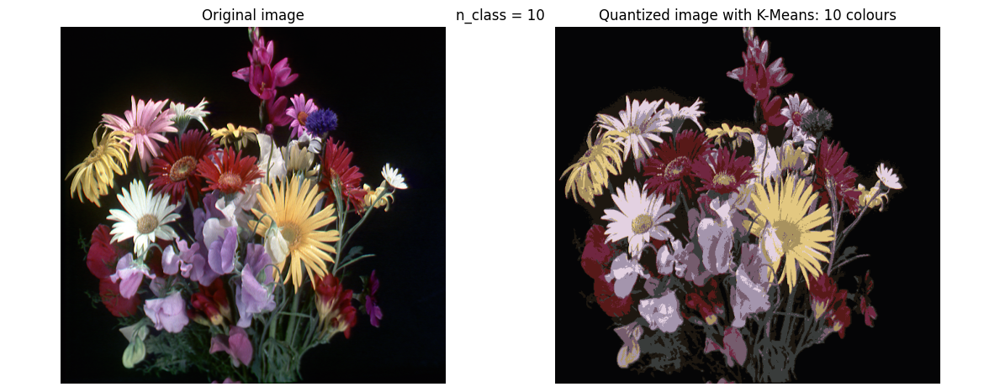

In [26]:
ima = io.imread('fleur.tif')
kmean3(ima,10)

Pour un nombre de class = 10 on obtient un résultat acceptable mais on a perdu beaucoup de couleurs qui appraissent dans des petites zones telles que le mauve et le bleu par example.

Fitting model on a small sub-sample of the data
done in 0.016s.
Predicting color indices on the full image (k-means)
done in 0.005s.


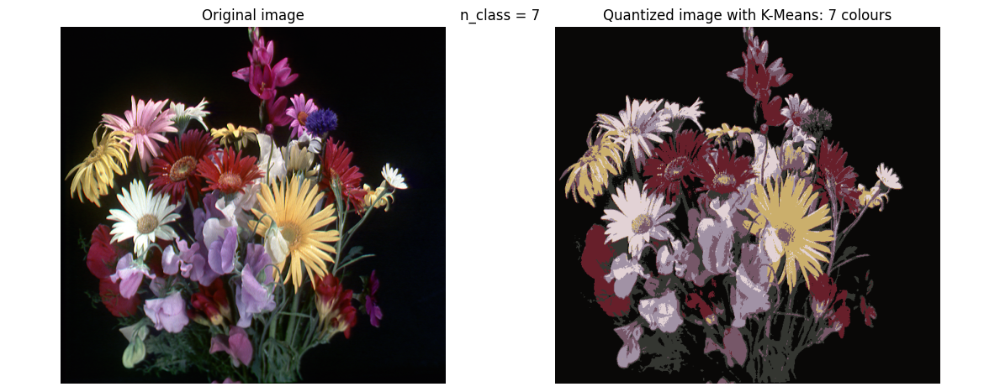

In [27]:
kmean3(ima,7)

> avec un nombre de couleurs égale à 7 on peut avoir un rendu acceptable


# 3. Seuillage automatique : Otsu

In [28]:
def histogram(im):
    
    nl,nc=im.shape
    
    hist=np.zeros(256)
    
    for i in range(nl):
        for j in range(nc):
            hist[im[i][j]]=hist[im[i][j]]+1
            
    for i in range(256):
        hist[i]=hist[i]/(nc*nl)
        
    return(hist)
    
    
def otsu_thresh(im):
    
    h=histogram(im)
    
    m=0
    for i in range(256):
        m=m+i*h[i]
    
    maxt=0
    maxk=0
    
    
    for t in range(256):
        w0=0
        w1=0
        m0=0
        m1=0
        for i in range(t):
            w0=w0+h[i]
            m0=m0+i*h[i]
        if w0 > 0:
            m0=m0/w0
        
        for i in range(t,256):
            w1=w1+h[i]
            m1=m1+i*h[i]
        if w1 > 0:   
            m1=m1/w1
        
        k=w0*w1*(m0-m1)*(m0-m1)    
        
        if k > maxk:
            maxk=k
            maxt=t
            
            
    thresh=maxt
        
    return(thresh)

Seuil Otsu (skimage) :  152
Seuil Otsu (Manuelle) :  153


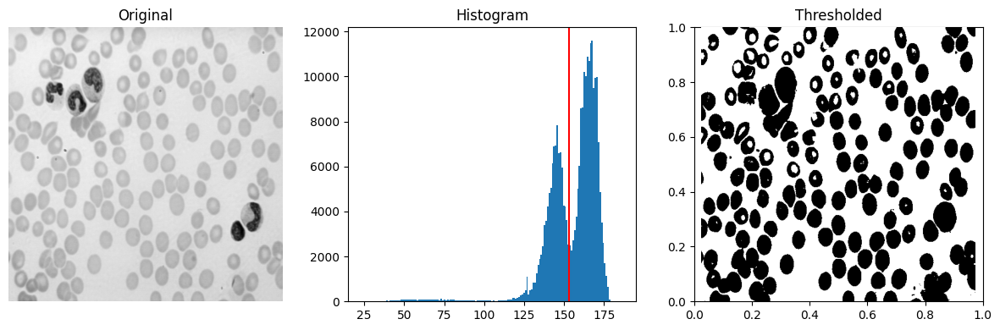

In [29]:
image = io.imread('cell.tif')
thresh = threshold_otsu(image)
print('Seuil Otsu (skimage) : ', thresh)
binary = image > thresh

thresh=otsu_thresh(image)
binary = image > thresh
print('Seuil Otsu (Manuelle) : ', thresh)

fig, axes = plt.subplots(ncols=3, figsize=(12, 4))
ax = axes.ravel()
ax[0] = plt.subplot(1, 3, 1)
ax[1] = plt.subplot(1, 3, 2)
ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

ax[0].imshow(image, cmap=plt.cm.gray)
ax[0].set_title('Original')
ax[0].axis('off')

bins=np.max(image)-np.min(image)+1

ax[1].hist(image.ravel(), bins=bins)
ax[1].set_title('Histogram')
ax[1].axvline(thresh, color='r')

ax[2].imshow(binary, cmap=plt.cm.gray)
ax[2].set_title('Thresholded')
ax[2].axis('off')

plt.tight_layout()
plt.show()

l'algorithme donne des bonnes resultat pour les image à deux classe (tels que l'image de cell )

oui, cet algorithme peut etre utilisé pour comme une alternative de seuillage pour la norme de gradient pour détecter le bon contour. En effet, Les normes plus grandes (plus claires), qui sont les contours devrait être sépare du noir (qu’est pas de contour).

In [30]:
def otsu_thresh2(im):
    warnings.filterwarnings('ignore')
    h=histogram(im)
    maxt=[0,0]
    maxk=0
    for t1 in range(256):
        for t2 in range(t1,256) :    
            w0=0
            w1=0
            w2=0
            m0=0
            m1=0
            m2=0
            for i in range(t1):
                w0=w0+h[i]
                m0=m0+i*h[i]
            if w0 > 0:
                m0=m0/w0
            for i in range(t1,t2):
                w1=w1+h[i]
                m1=m1+i*h[i]
            if w1 > 0:   
                m1=m1/w1
            for i in range(t2,256):
                w2=w2+h[i]
                m2=m2+i*h[i]
            if w1 > 0:   
                m2=m2/w2

            k=w0*w1*w2*(m0-m1)*(m0-m1)*(m2-m1)*(m2-m1)    

            if k > maxk:
                maxk=k
                maxt=[t1,t2]


        thresh=maxt

    return(thresh)
def compute_threshold2 (image):
    thresh = otsu_thresh2(image)
    result = np.zeros_like(image)
    result[ image > thresh[0]] = 128
    result[ image > thresh[1]] = 255
    
    #print(thresh,np.unique(result))
    fig, axes = plt.subplots(ncols=3, figsize=(8, 2.5))
    ax = axes.ravel()
    ax[0] = plt.subplot(1, 3, 1)
    ax[1] = plt.subplot(1, 3, 2)
    ax[2] = plt.subplot(1, 3, 3, sharex=ax[0], sharey=ax[0])

    ax[0].imshow(image, cmap=plt.cm.gray)
    ax[0].set_title('Original')
    ax[0].axis('off')

    bins=np.max(image)-np.min(image)+1

    ax[1].hist(image.ravel(), bins=bins)
    ax[1].set_title('Histogram')
    ax[1].axvline(thresh[0], color='r')
    ax[1].axvline(thresh[1], color='r')
    ax[1].axis('off')
    
    ax[2].imshow(result, cmap=plt.cm.gray)
    ax[2].set_title('Thresholded')
    ax[2].axis('off')

    plt.show()

In [31]:
image1 =io.imread('pyramide.tif')
image2 =io.imread('lena.tif')

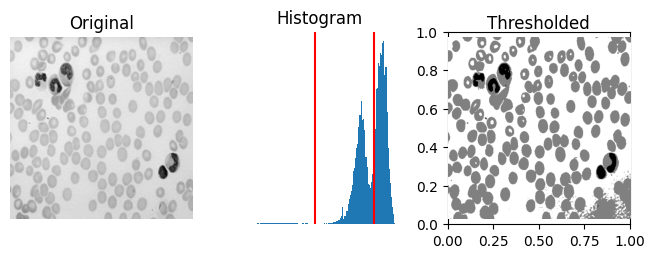

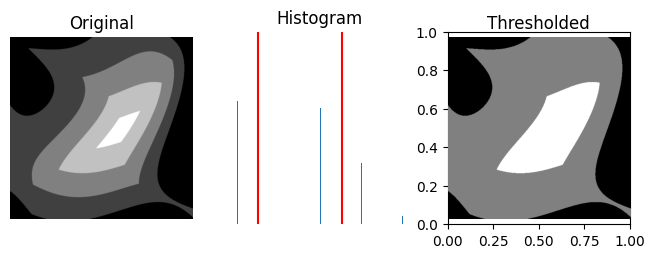

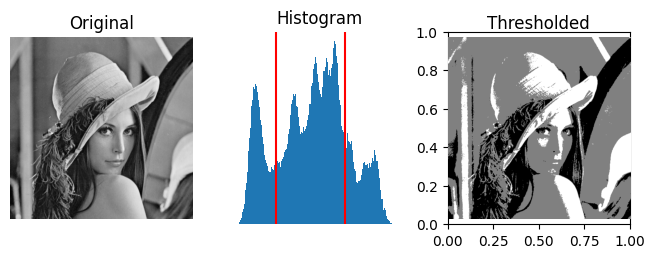

In [32]:
compute_threshold2(image)
compute_threshold2(image1)
compute_threshold2(image2)

# 4 Croissance de régions

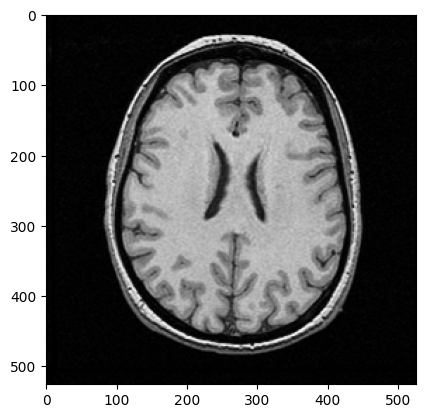

In [33]:
def my_perimeter(im):
    se=morpho.disk(1)
    dil=morpho.dilation(im,se)
    diff=dil-im
    ta=np.nonzero(diff)
    return ta
    
def histogram(im):
    
    nl,nc=im.shape
    
    hist=np.zeros(256)
    
    for i in range(nl):
        for j in range(nc):
            hist[im[i][j]]=hist[im[i][j]]+1
            
    for i in range(256):
        hist[i]=hist[i]/(nc*nl)
        
    return(hist)
 

im=io.imread('cerveau.tif')
mask=np.zeros((len(im),len(im[0])))

plt.figure('Image originale')
plt.imshow(im,cmap='gray')
plt.show()

### paramètres
# position du germe initial
y0=300
x0=300
# seuil du prédicat
thresh=2
# voisinage pour le calcul de la moyenne et de l'écart-type locaux
rayon=5

# Masque initial
mask[y0,x0]=255

ext=im[y0-rayon:y0+rayon+1,x0-rayon:x0+rayon+1]
m0=np.mean(ext)
s0=np.std(ext)

# Boucle tant qu'il y a des changements.

modif=1
iter = 0 
while modif >  0:

    iter=iter+1
        
    modif=0

    # Calcul du périmètre du masque
    
    per=my_perimeter(mask)

    # Boucle sur les points du périmètre
    for i in range (0 , len(per[0])):

        y=per[0][i]
        x=per[1][i]
        ext=im[y-rayon:y+rayon+1,x-rayon:x+rayon+1]
        m=np.mean(ext)
        s=np.std(ext)

        # Prédicat

        if np.abs(m0-m) < thresh * s0 :
            mask[y][x]=255
            modif=1

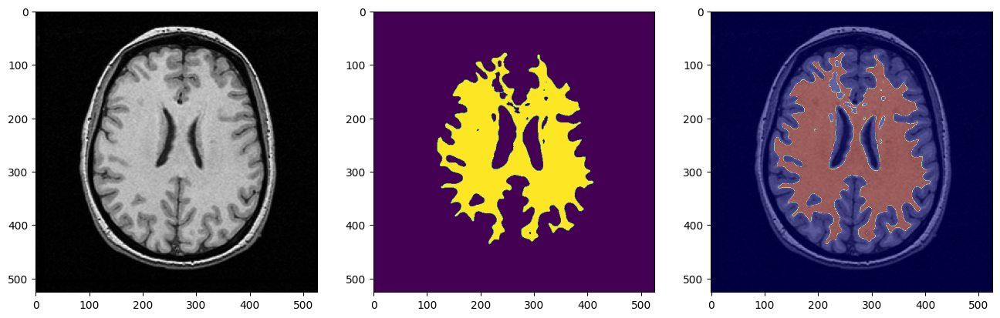

In [34]:
fig,axes = plt.subplots(1,3,figsize=(16,13))
axes[0].imshow(im,cmap='gray')
axes[2].imshow(im, cmap='gray')
axes[2].imshow(mask, cmap='jet', alpha=0.5)
axes[1].imshow(mask);

Pour etre ajouté à la region, le pixel dans le perimetre doit avoir une moyenne dans la
fentre carré centré en ce pixel proche de la moyenne d'une meme fentre centre sur le
pixel de départ avec une tolerance de thresh foirs l'ecart-type de la meme fentre de pixel
original

Le parametre thresh influence sur notre hypothese de degres d'homogenieté. En effet, il
presente le degre de regidité d'avoir une region semblalbe à celle de départ. Donc des
fortes valeur de sueil vont engendrer plus de point accepté dans la region et
inversement, pour des faible valeur de ce seuil on aura moin de pixel.

Les parametres sont le point de départ, le seuil et le rayon. En effet il est crucial d'avoir
un point de départ dans un pixel de la matiere blanche pour que cette region soit
reconnut avec cet algorithm. Le seuil et le rayon influence sur notre precision dans
l'exploration des voisinage, des grosses valeurs pour ces deux parametre peut entrainer
la couverture de la matiere grise avec la region de la matiere blanche meme si on a
commencer avec un bon point de départ.

Non, il n'est pas possible de segementer toute la matiere grise avec cet algorithm. En
effet, la zone qui contient la matiere grise n'est pas contigue. Elle se compose de plusieur
région. avec un seul point de départ il n'est possible que d'obtenir l'un de ces région
avec cet algorithm.

Le prédicat mis en oeuve est lié à la différences limitées des moyennes locaux. C'est le
critere d'homogeniété d'une region donné dans cet algorithm
On peut retrouver le meme resultat on peut utiliser la méthode markovienne en
considerant une énergie définie globalament sur l'image et en la minimisant toute en
respectant les contrainte d'attache aux données et de terme contextuel.

Le prédicat d'écart type (l'ecart type de la region ne depasse pas un certain seuil)
nécessite reellement la méthode de croissance de région